## argmax 만을 사용해서 Q 값 변화 없음을 확인하기

In [1]:
import numpy as np
import random as pr
import gymnasium as gym

# 환경설정
env = gym.make("FrozenLake-v1", is_slippery=False)

# Q 테이블 초기화 (상태 X 행동)
Q = np.zeros((env.observation_space.n, env.action_space.n))
num_episodes = 2000
rewards_per_episode = []

for episode in range(num_episodes):
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q 값이 가장 큰 행동 선택
        action = np.argmax(Q[state])

        # 행동 수행 및 결과 관찰
        (next_state, reward, terminated, truncated, _) = env.step(action)
        done = terminated or truncated  # 종료조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)

# 결과 출력
print(f"\n 마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
print("최종 Q 테이블 :")
print(Q)


 마지막 100 에피소드 평균 보상 : 0.0000
최종 Q 테이블 :
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


## 최소 reward 가 없을때는 Q값을 랜덤으로 부여하여 강제로 움직이게 만들기

In [2]:
# Q값이 동일한 경우 무작위로 최대값 인덱스를 선택하는 함수


def rargmax(vector):
    """Argmax that chooses randomly among eligible maximum indices."""
    m = np.amax(vector)
    indices = np.nonzero(vector == m)[0]
    return pr.choice(indices)


env = gym.make("FrozenLake-v1", is_slippery=False)

Q = np.zeros((env.observation_space.n, env.action_space.n))

num_episodes = 2000

rewards_per_episode = []

for episode in range(num_episodes):
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q 값이 가장 큰 행동 선택
        action = rargmax(Q[state])

        # 행동 수행 및 결과 관찰
        (next_state, reward, terminated, truncated, _) = env.step(action)
        done = terminated or truncated  # 종료조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)

# 결과 출력
print(f"\n 마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
print("최종 Q 테이블 :")
print(Q)


 마지막 100 에피소드 평균 보상 : 1.0000
최종 Q 테이블 :
[[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 0.]]


In [3]:
# Q값이 동일한 경우 무작위로 최대값 인덱스를 선택하는 함수


def rargmax(vector):
    """Argmax that chooses randomly among eligible maximum indices."""
    m = np.amax(vector)
    indices = np.nonzero(vector == m)[0]
    return pr.choice(indices)


env = gym.make("FrozenLake-v1", is_slippery=False)

Q = np.zeros((env.observation_space.n, env.action_space.n))

num_episodes = 2000

rewards_per_episode = []

for episode in range(num_episodes):
    print(episode)
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q 값이 가장 큰 행동 선택
        action = rargmax(Q[state])

        # 행동 수행 및 결과 관찰
        (next_state, reward, terminated, truncated, _) = env.step(action)
        done = terminated or truncated  # 종료조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward
    print(Q)
    rewards_per_episode.append(total_reward)
    print(rewards_per_episode)

# 결과 출력
print(f"\n 마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
print("최종 Q 테이블 :")
print(Q)

0
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
[0.0]
1
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
[0.0, 0.0]
2
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
[0.0, 0.0, 0.0]
3
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 

## 2000번의 데이터 시각화 추가

Success rate: 0.941
Final Q-Table Values
LEFT  DOWN  RIGHT  UP
[[0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 0.]]


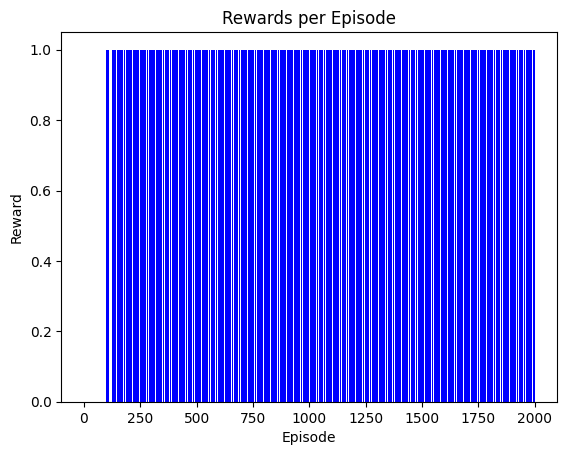

In [4]:
import numpy as np
import gymnasium as gym
import random as pr
import matplotlib.pyplot as plt

# 각에피소드에서받은총보상저장리스트
rList = []

Q = np.zeros([env.observation_space.n, env.action_space.n])

# 학습루프
for episode in range(num_episodes):
    state, _ = env.reset()
    done = False
    total_reward = 0
    while not done:
        action = rargmax(Q[state])
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        Q[state, action] = reward + np.max(Q[next_state])
        state = next_state
        total_reward += reward
    rList.append(total_reward)
    # 출력
print("Success rate: " + str(sum(rList) / num_episodes))
print("Final Q-Table Values")
print("LEFT  DOWN  RIGHT  UP")
print(Q)
# 시각화: 에피소드별보상히스토그램
plt.bar(range(len(rList)), rList, color="blue")
plt.title("Rewards per Episode")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.show()

## Q테이블의 변화를 주어 여러 경로로 학습시키기

Success rate: 0.931
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0.      0.59049 0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.729   0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.6561  0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.81    0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.      0.729   0.     ]
 [0.      0.      0.81    0.     ]
 [0.      0.9     0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.      0.      0.     ]
 [0.      0.      0.9     0.     ]
 [0.      0.      1.      0.     ]
 [0.      0.      0.      0.     ]]


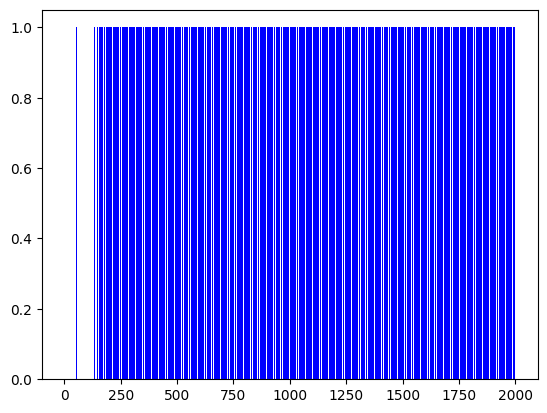

In [5]:
Q = np.zeros([env.observation_space.n, env.action_space.n])

dis = 0.9

rList = []

for i in range(num_episodes):
    state, _ = env.reset()
    rAll = 0
    done = False

    while not done:
        action = np.argmax(
            Q[state, :] + np.random.randn(1, env.action_space.n) / (i + 1)
        )

        new_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated

        Q[state, action] = reward + dis * np.max(Q[new_state, :])

        rAll += reward
        state = new_state
    rList.append(rAll)

print("Success rate: " + str(sum(rList) / num_episodes))
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(Q)
# 시각화: 에피소드별보상히스토그램
plt.bar(range(len(rList)), rList, color="blue")
plt.show()

## Slippery 를 True 했을때

Success rate: 0.206
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0.2974 0.0046 0.007  0.003 ]
 [0.004  0.0002 0.0002 0.0046]
 [0.0012 0.0001 0.     0.0003]
 [0.     0.0001 0.     0.    ]
 [0.3087 0.0052 0.0016 0.0008]
 [0.     0.     0.     0.    ]
 [0.     0.0164 0.     0.    ]
 [0.     0.     0.     0.    ]
 [0.0004 0.0021 0.     0.3347]
 [0.     0.3491 0.005  0.    ]
 [0.     0.3995 0.     0.    ]
 [0.     0.     0.     0.    ]
 [0.     0.     0.     0.    ]
 [0.     0.3762 0.     0.    ]
 [0.     0.     0.     0.7099]
 [0.     0.     0.     0.    ]]


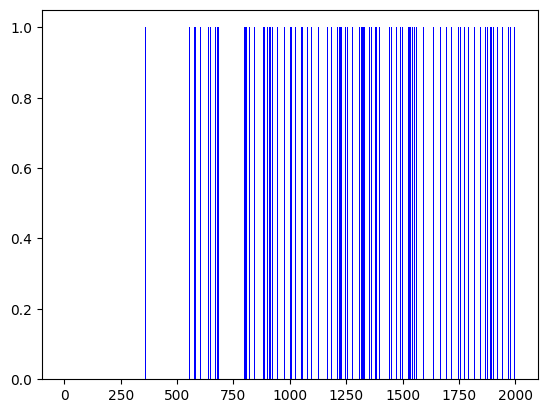

In [6]:
import numpy as np
import gymnasium as gym
import random as pr
import matplotlib.pyplot as plt

np.set_printoptions(precision=4, suppress=True)


def rargmax(vector):
    m = np.amax(vector)
    indices = np.nonzero(vector == m)[0]
    return pr.choice(indices)


env = gym.make("FrozenLake-v1", is_slippery=True)

Q = np.zeros([env.observation_space.n, env.action_space.n])

dis = 0.99
alpha = 0.2
num_episodes = 2000

rList = []

for i in range(num_episodes):
    state, _ = env.reset()
    rAll = 0
    done = False

    while not done:
        action = np.argmax(
            Q[state, :] + np.random.randn(1, env.action_space.n) / (i + 1)
        )
        new_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        target = reward + dis * np.max(Q[new_state, :])
        Q[state, action] = (1 - alpha) * Q[state, action] + alpha * target
        rAll += reward
        state = new_state
    rList.append(rAll)

print("Success rate: " + str(sum(rList) / num_episodes))
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(Q)
plt.bar(range(len(rList)), rList, color="blue")
plt.show()

Success rate: 0.452
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0.004 0.522 0.003 0.014]
 [0.    0.001 0.001 0.394]
 [0.003 0.002 0.001 0.269]
 [0.    0.    0.    0.202]
 [0.473 0.001 0.008 0.001]
 [0.    0.    0.    0.   ]
 [0.    0.    0.193 0.001]
 [0.    0.    0.    0.   ]
 [0.005 0.001 0.    0.401]
 [0.    0.157 0.    0.   ]
 [0.855 0.001 0.001 0.   ]
 [0.    0.    0.    0.   ]
 [0.    0.    0.    0.   ]
 [0.    0.    0.869 0.002]
 [0.    0.997 0.    0.   ]
 [0.    0.    0.    0.   ]]


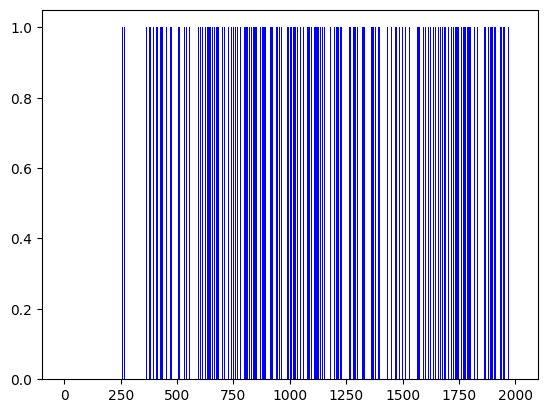

In [14]:
import numpy as np
import gymnasium as gym  # Gymnasium 라이브러리 사용
import matplotlib.pyplot as plt
import random as pr


def rargmax(vector):
    """최대Q값중무작위인덱스선택"""
    m = np.amax(vector)
    indices = np.nonzero(vector == m)[0]
    return pr.choice(indices)


# FrozenLake 환경 생성(Gymnasium 방식)
env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=True)
# Q 테이블초기화
Q = np.zeros([env.observation_space.n, env.action_space.n])
# 할인율및학습률설정
dis = 0.99
num_episodes = 2000
learning_rate = 0.85
# 보상리스트초기화
rList = []

for i in range(num_episodes):
    state, _ = env.reset()
    rAll = 0
    done = False

    while not done:
        action = np.argmax(
            Q[state, :] + np.random.randn(1, env.action_space.n) / (i + 1)
        )
        new_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated

        Q[state, action] = (1 - learning_rate) * Q[state, action] + learning_rate * (
            reward + dis * np.max(Q[new_state, :])
        )
        rAll += reward
        state = new_state
    rList.append(rAll)

# 결과출력(소수점3자리로제한)
print("Success rate: {:.3f}".format(sum(rList) / num_episodes))
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(np.round(Q, 3))
plt.bar(range(len(rList)), rList, color="blue")
plt.show()